In [68]:
 pip install plotly

Note: you may need to restart the kernel to use updated packages.Collecting plotly
     ---------------------------------------- 15.2/15.2 MB 1.6 MB/s eta 0:00:00




[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [13]:
pip install -U scikit-learn


     ---------------------------------------- 8.3/8.3 MB 1.8 MB/s eta 0:00:00
     -------------------------------------- 298.0/298.0 kB 2.3 MB/s eta 0:00:00
     ---------------------------------------- 42.5/42.5 MB 1.8 MB/s eta 0:00:00



[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [38]:
pip install pydot


[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [41]:
pip install graphviz


[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



     -------------------------------------- 47.0/47.0 kB 334.5 kB/s eta 0:00:00


In [43]:

pip install pydotplus



     ------------------------------------ 278.7/278.7 kB 209.6 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24554 sha256=500204220355d530d1ce335ca2bb8c915052f1bc797f14183a8e0f7f838ea9ea
  Stored in directory: c:\users\regina\appdata\local\pip\cache\wheels\69\b2\67\08f0eef649af92df772c09f451558298e07fab1bc7cdf33db0
Successfully built pydotplus



[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import os
import random
import keras

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from  tensorflow import keras

In [3]:
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
  

In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Conv2D, Dense, Dropout, Flatten, MaxPooling2D
from tensorflow.keras.preprocessing import image
from keras.metrics import categorical_crossentropy
import plotly.graph_objects as go
import itertools
import plotly.express as px

In [5]:
from sklearn.metrics import precision_score, accuracy_score, recall_score, confusion_matrix,classification_report

In [6]:
df = pd.read_csv('C:/Users/Regina/Desktop/Coventry_DS_CI/ANN/coffee beans/Coffee Bean.csv')


In [7]:
df

,class index,filepaths,labels,data set
0,0,train/Dark/dark (1).png,Dark,train
1,0,train/Dark/dark (10).png,Dark,train
2,0,train/Dark/dark (100).png,Dark,train
3,0,train/Dark/dark (101).png,Dark,train
4,0,train/Dark/dark (102).png,Dark,train
...,...,...,...,...
1595,3,test/Medium/medium (95).png,Medium,test
1596,3,test/Medium/medium (96).png,Medium,test
1597,3,test/Medium/medium (97).png,Medium,test
1598,3,test/Medium/medium (98).png,Medium,test


In [8]:
# Dataset details

In [9]:
coffee_class = sorted(os.listdir('C:/Users/Regina/Desktop/Coventry_DS_CI/ANN/coffee beans/train'))
coffee_n_classes = len(coffee_class)


In [10]:
coffee_class

['Dark', 'Green', 'Light', 'Medium']

In [11]:
from glob import glob 


In [12]:
# importing dataset

In [13]:
coffee_train = 'C:/Users/Regina/Desktop/Coventry_DS_CI/ANN/coffee beans/train'
coffee_test = 'C:/Users/Regina/Desktop/Coventry_DS_CI/ANN/coffee beans/test'

In [14]:
pics_train = os.listdir(coffee_train)
pics_test = os.listdir(coffee_train)

In [15]:
print("Coffee_Train folder: ", os.listdir(coffee_train))
print("Coffee_Test folder: ", os.listdir(coffee_test))

Coffee_Train folder:  ['Dark', 'Green', 'Light', 'Medium']
Coffee_Test folder:  ['Dark', 'Green', 'Light', 'Medium']


In [16]:
# Number of images for each class - TRAIN DATA

nums_train = {}
for pics_train in pics_train:
    nums_train[pics_train] = len(os.listdir(coffee_train + '/' + pics_train))
img_each_class_train = pd.DataFrame(nums_train.values(), index=nums_train.keys(), columns=["Total no. of images"])
print('Distribution of Coffee train data :')
img_each_class_train

Distribution of Coffee train data :


,Total no. of images
Dark,300
Green,300
Light,300
Medium,300


In [17]:
# show number of images in train data
number_train = 0
for value in nums_train.values():
    number_train += value
print("The number of images for training : ",number_train)

The number of images for training :  1200


<AxesSubplot: title={'center': 'Distribution of Coffee train data '}, xlabel='Number of images', ylabel='various classes'>

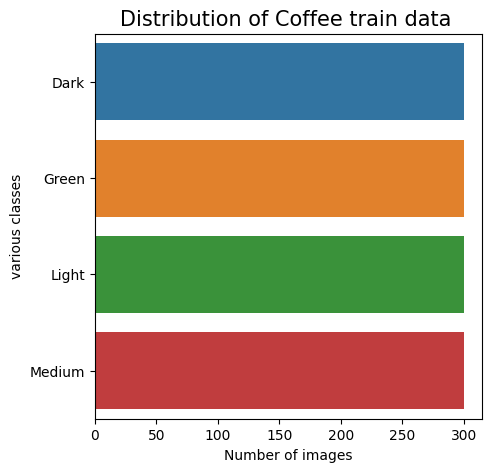

In [18]:
plt.figure(figsize=(5,5))
plt.title('Distribution of Coffee train data ',fontsize=15)
plt.xlabel('Number of images',fontsize=10)
plt.ylabel('various classes',fontsize=10)

keys = list(nums_train.keys())
vals = list(nums_train.values())
sns.barplot(y=keys, x=vals)

In [19]:
# Number of images for each class - TEST DATA

nums_test = {}
for pics_test in pics_test:
    nums_test[pics_test] = len(os.listdir(coffee_test + '/' + pics_test))
img_each_class_test = pd.DataFrame(nums_test.values(), index=nums_test.keys(), columns=["Total no. of images"])
print('Distribution of Coffee test data :')
img_each_class_test

Distribution of Coffee test data :


,Total no. of images
Dark,100
Green,100
Light,100
Medium,100


In [20]:
# show number of images in test data
number_test = 0
for value in nums_test.values():
    number_test += value
print("The number of images for testing : ",number_test)

The number of images for testing :  400


<AxesSubplot: title={'center': 'Distribution of Coffee test data '}, xlabel='Number of images', ylabel='various classes'>

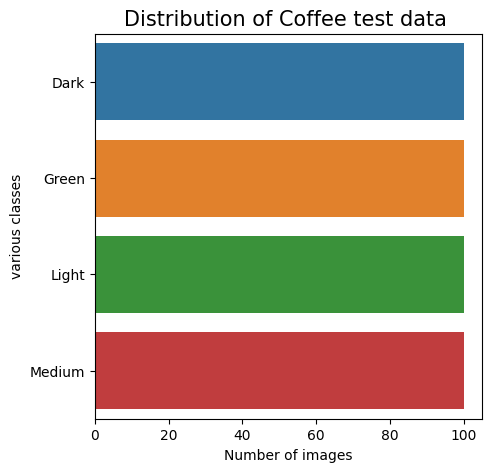

In [21]:
plt.figure(figsize=(5,5))
plt.title('Distribution of Coffee test data ',fontsize=15)
plt.xlabel('Number of images',fontsize=10)
plt.ylabel('various classes',fontsize=10)

keys = list(nums_test.keys())
# get values in the same order as keys, and parse percentage values
vals = list(nums_test.values())
sns.barplot(y=keys, x=vals)

In [22]:
# percentage of data splitted

In [23]:
random_x = [len(str(number_train)), len(str(number_test))]
names = ['Train_Data', 'Test_Data']
fig = px.pie(values=random_x, names=names)
fig.update_layout(title='Data Distribution',font_size=15,title_x=0.45,annotations=[dict(text='Coffee Beans',font_size=18, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

In [24]:
# Data Visualization

In [25]:
def plot_sample_img(folder_dir, no_of_samples = 5, figsize = (30, 5)):
    
    coffee_folder = os.listdir(folder_dir)
  
    
    for coffee_folder in coffee_folder:
        img_path = folder_dir + '/' + coffee_folder
        
        fig, ax = plt.subplots(1, no_of_samples, figsize = figsize)
        plt.suptitle("Coffee beans belong to " + coffee_folder,color='darkblue',fontsize=20)
        
      
        for img_num in range(no_of_samples):
            
            random_img_name = random.choice(os.listdir(img_path))
            img_matrix = plt.imread(img_path + '/' + random_img_name)
            ax[img_num].imshow(img_matrix)
            ax[img_num].set_title(random_img_name)

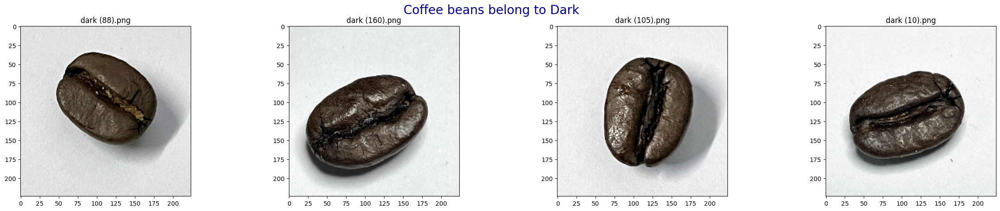

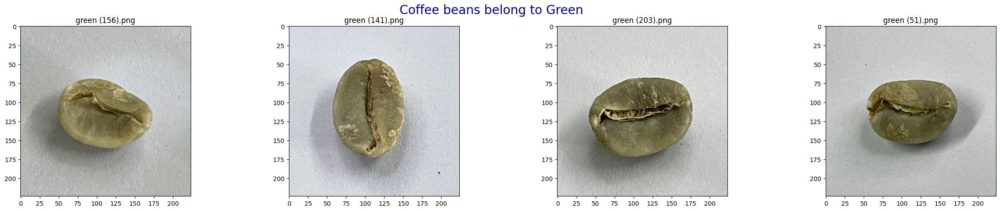

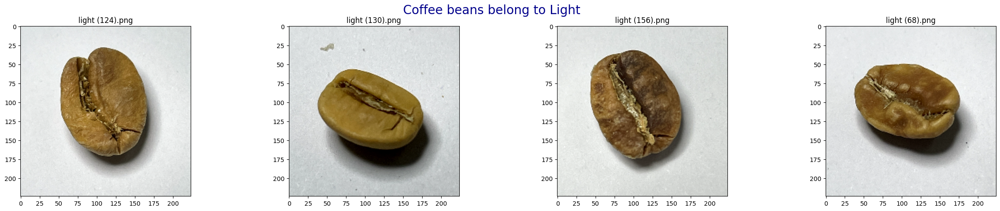

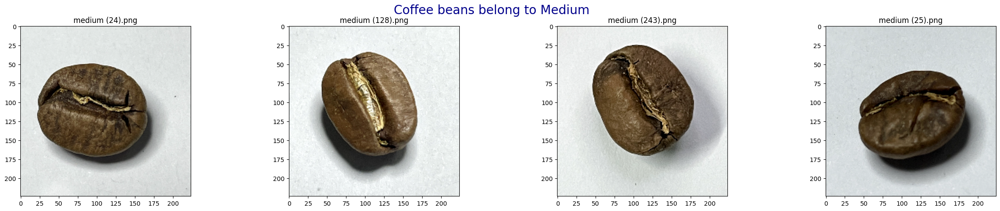

In [26]:
plot_sample_img(coffee_train, no_of_samples = 4, figsize = (30, 5))

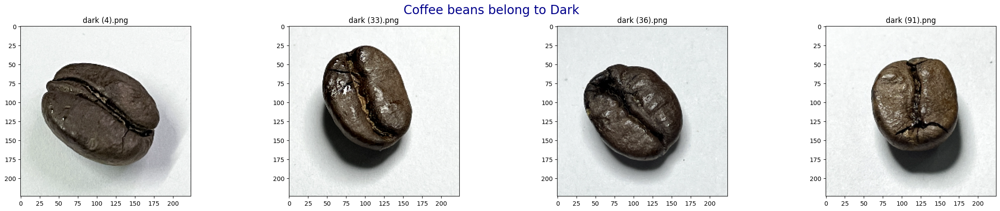

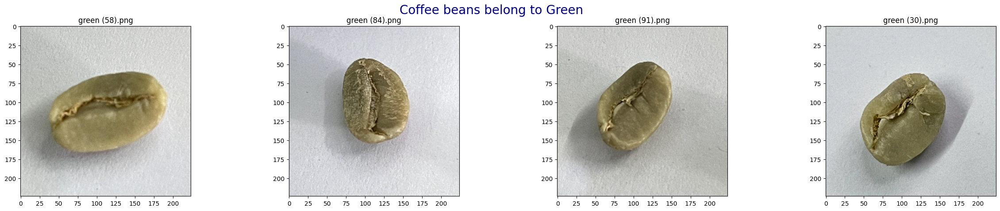

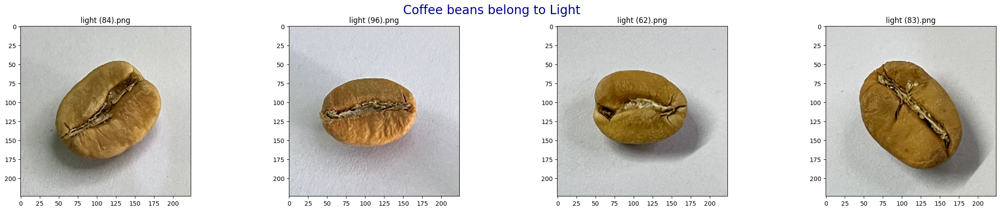

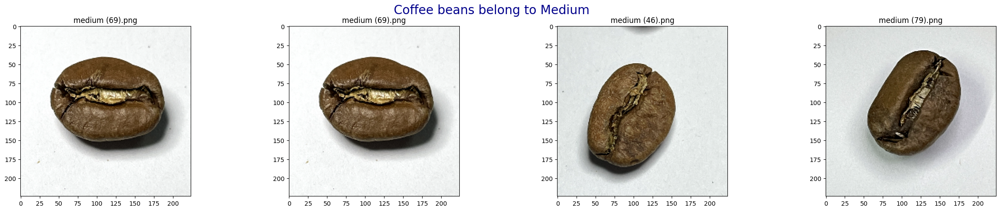

In [27]:
plot_sample_img(coffee_test, no_of_samples = 4, figsize = (30, 5))

In [28]:
# Test and Train definition

In [29]:
Image_gen=ImageDataGenerator(rotation_range = 20, width_shift_range = 0.1, height_shift_range = 0.1,
                               shear_range = 0.1, zoom_range = 0.1, horizontal_flip = True,
                               fill_mode = 'nearest')


In [30]:
def data_transformation_images(folder_dir, img_gen_object, no_of_samples = 5, figsize = (35, 5)):
    
    coffee_folder = os.listdir(folder_dir)
    

    for coffee_folder in coffee_folder:
        img_path = folder_dir + '/' + coffee_folder
        fig, ax = plt.subplots(1, no_of_samples, figsize = figsize)
        
        random_img_name = random.choice(os.listdir(folder_dir + '/' + coffee_folder))
        random_img = plt.imread(folder_dir + '/' + coffee_folder + '/' + random_img_name)
        
        plt.suptitle("Coffee beans falls into " + coffee_folder + '-> ' + 'Specific category: ' + random_img_name,color='darkblue',fontsize=20)
        
        for img_num in range(no_of_samples):
            ax[img_num].imshow(Image_gen.random_transform(random_img))
            ax[img_num].set_title('Transition Digit: {}'.format(img_num + 1))

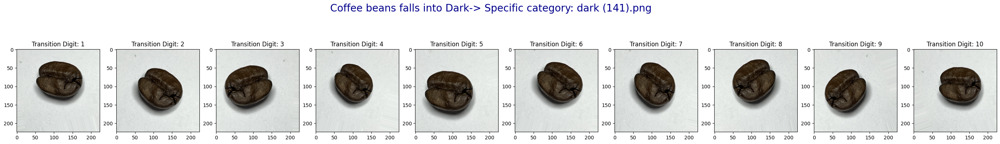

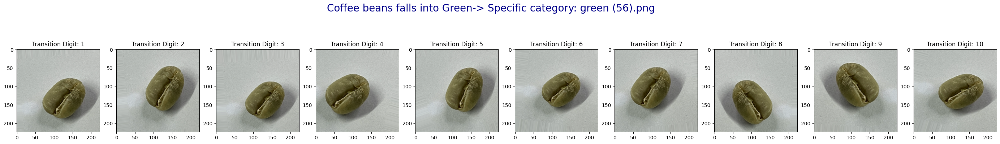

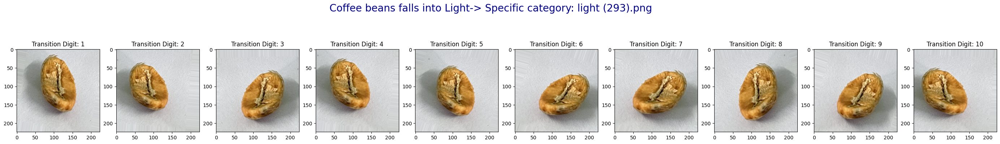

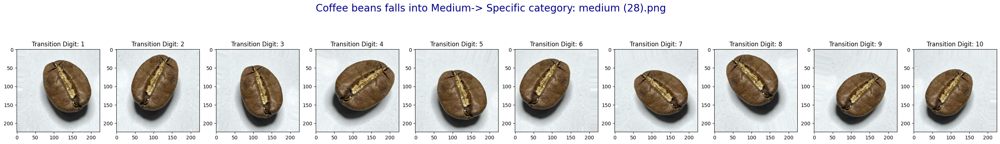

In [31]:
data_transformation_images(coffee_train, Image_gen, no_of_samples = 10)

In [32]:

Image_gen.flow_from_directory(coffee_train)
Image_gen.flow_from_directory(coffee_test)



Found 1200 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


In [33]:

image_shape = (224, 224, 3)

train_gen_pics = Image_gen.flow_from_directory(coffee_train, target_size =image_shape[:2], 
                                                color_mode = 'rgb', batch_size = 32,
                                                class_mode = 'categorical')


test_gen_pics = Image_gen.flow_from_directory(coffee_test, target_size = image_shape[:2], 
                                                color_mode = 'rgb', batch_size = 32, 
                                                class_mode = 'categorical', shuffle = False)

train_gen_pics.class_indices



Found 1200 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


{'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}

In [83]:
# Modelling 

In [34]:
#CNN  Model 1

model_cnn1=Sequential()

# 3 CNN layers
model_cnn1.add(Conv2D(32,kernel_size = (3, 3),data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn1.add(MaxPooling2D(pool_size=(2,2)))
model_cnn1.add(Conv2D(64,kernel_size = (3, 3),data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn1.add(MaxPooling2D(pool_size=(2,2)))
model_cnn1.add(Conv2D(128,kernel_size = (3, 3),data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn1.add(MaxPooling2D(pool_size=(2,2)))

# 1 hidden layer
model_cnn1.add(Flatten())
model_cnn1.add(Dense(256))
model_cnn1.add(Dropout(0.5))

#output layer
model_cnn1.add(Dense(4))
model_cnn1.add(Activation('softmax'))

#Compiling the model
model_cnn1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [48]:
model_cnn1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 128)      0

In [50]:
results = model_cnn1.fit(train_gen_pics, epochs = 20, validation_data = test_gen_pics)

Epoch 1/20
38/38 [==============================] - 103s 3s/step - loss: 0.6746 - accuracy: 0.7158 - val_loss: 0.5615 - val_accuracy: 0.7625
Epoch 2/20
38/38 [==============================] - 93s 2s/step - loss: 0.5984 - accuracy: 0.7625 - val_loss: 0.6180 - val_accuracy: 0.7175
Epoch 3/20
38/38 [==============================] - 90s 2s/step - loss: 0.6063 - accuracy: 0.7458 - val_loss: 0.4756 - val_accuracy: 0.7950
Epoch 4/20
38/38 [==============================] - 88s 2s/step - loss: 0.4767 - accuracy: 0.8133 - val_loss: 0.3801 - val_accuracy: 0.8625
Epoch 5/20
38/38 [==============================] - 86s 2s/step - loss: 0.3809 - accuracy: 0.8617 - val_loss: 0.3379 - val_accuracy: 0.8975
Epoch 6/20
38/38 [==============================] - 89s 2s/step - loss: 0.4376 - accuracy: 0.8333 - val_loss: 0.2563 - val_accuracy: 0.9475
Epoch 7/20
38/38 [==============================] - 93s 2s/step - loss: 0.2925 - accuracy: 0.9167 - val_loss: 0.1956 - val_accuracy: 0.9525
Epoch 8/20
38/38 [=

In [51]:
model_cnn1.save('coffee_classifier_model1.h5')

In [52]:
def plot(c):
    plt.plot(c.history.history['accuracy'],marker='*',color='purple',markersize=10)
    plt.plot(c.history.history['val_accuracy'],marker='.',color='darkorange',markersize=10)
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()
    plt.plot(c.history.history['loss'],marker='*',color='purple',markersize=10)
    plt.plot(c.history.history['val_loss'],marker='.',color='darkorange',markersize=10)
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()

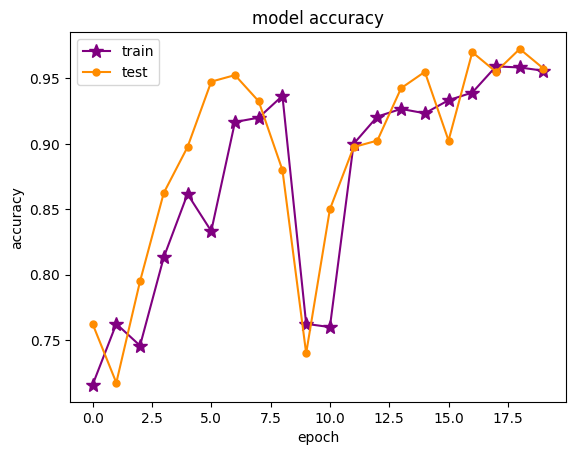

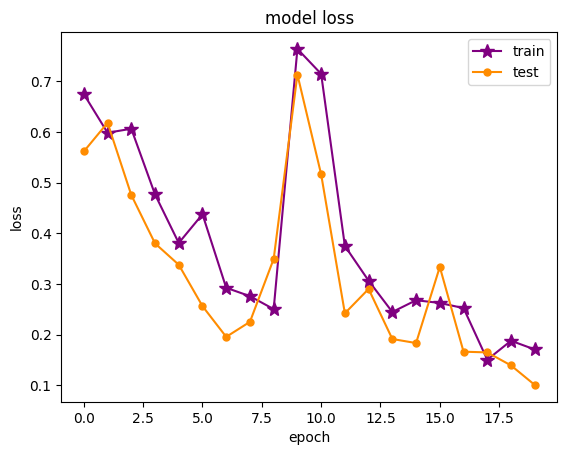

In [53]:
plot(model_cnn1)

In [54]:
# Model 2

In [55]:
from tensorflow.keras.callbacks import EarlyStopping

In [56]:
#CNN  Model2

model_cnn2=Sequential()

# 4 layers
model_cnn2.add(Conv2D(32,kernel_size = (3, 3),data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn2.add(MaxPooling2D(pool_size=(2,2)))
model_cnn2.add(Conv2D(64,3,data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn2.add(MaxPooling2D(pool_size=(2,2)))
model_cnn2.add(Conv2D(64,3,data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn2.add(MaxPooling2D(pool_size=(2,2)))
model_cnn2.add(Conv2D(128,3,data_format='channels_last',activation='relu',input_shape=(224,224,3)))
model_cnn2.add(MaxPooling2D(pool_size=(2,2)))

# 2 hidden layers
model_cnn2.add(Flatten())
model_cnn2.add(Dense(512))
model_cnn2.add(Activation("relu"))
model_cnn2.add(Dropout(0.5))

model_cnn2.add(Dense(512))
model_cnn2.add(Activation("relu"))

#output layer
model_cnn2.add(Dense(4))
model_cnn2.add(Activation('softmax'))

#Compiling the model
model_cnn2.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [57]:
model_cnn2.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 26, 26, 64)      

In [58]:
custom_early_stopping = EarlyStopping(
    monitor='val_accuracy', 
    patience=10, verbose = 1,
    min_delta=0.001, 
    mode='max'
)

In [59]:
model_cnn2.fit(train_gen_pics,epochs=100,validation_data=test_gen_pics,shuffle=True,
         callbacks=[custom_early_stopping])

Epoch 1/100
38/38 [==============================] - 86s 2s/step - loss: 10.7813 - accuracy: 0.5692 - val_loss: 0.4561 - val_accuracy: 0.8150
Epoch 2/100
38/38 [==============================] - 80s 2s/step - loss: 0.2668 - accuracy: 0.9067 - val_loss: 0.1112 - val_accuracy: 0.9650
Epoch 3/100
38/38 [==============================] - 82s 2s/step - loss: 0.1741 - accuracy: 0.9458 - val_loss: 0.3121 - val_accuracy: 0.8950
Epoch 4/100
38/38 [==============================] - 91s 2s/step - loss: 0.2052 - accuracy: 0.9308 - val_loss: 0.1188 - val_accuracy: 0.9600
Epoch 5/100
38/38 [==============================] - 80s 2s/step - loss: 0.1264 - accuracy: 0.9592 - val_loss: 0.0856 - val_accuracy: 0.9725
Epoch 6/100
38/38 [==============================] - 80s 2s/step - loss: 0.1130 - accuracy: 0.9608 - val_loss: 0.0692 - val_accuracy: 0.9800
Epoch 7/100
38/38 [==============================] - 81s 2s/step - loss: 0.0622 - accuracy: 0.9800 - val_loss: 0.0749 - val_accuracy: 0.9825
Epoch 8/100


In [60]:
model_cnn2.save('coffee_classifier_model2.h5')

In [61]:
def plot(c):
    plt.plot(c.history.history['accuracy'],marker='*',color='purple',markersize=10)
    plt.plot(c.history.history['val_accuracy'],marker='.',color='darkorange',markersize=10)
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()
    plt.plot(c.history.history['loss'],marker='*',color='purple',markersize=10)
    plt.plot(c.history.history['val_loss'],marker='.',color='darkorange',markersize=10)
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()

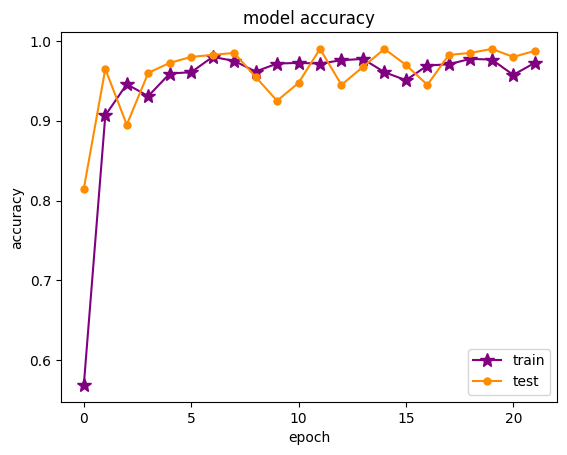

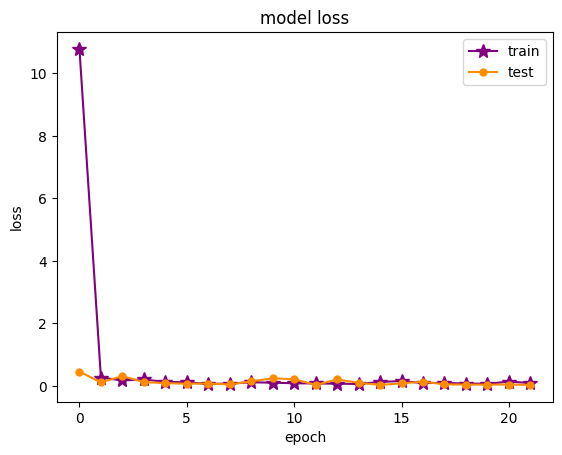

In [62]:
plot(model_cnn2)

In [63]:
pred_data = model_cnn1.predict(test_gen_pics) # gives probabilites
predictions = np.argmax(pred_data, axis = -1)

13/13 [==============================] - 12s 769ms/step


In [64]:
test_steps_per_epoch = np.math.ceil(test_gen_pics.samples / test_gen_pics.batch_size)

predictions = model_cnn1.predict(test_gen_pics, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)
   

13/13 [==============================] - 10s 733ms/step


In [65]:
#true_classes = test_.classes
class_labels = list(train_gen_pics.class_indices.keys()) 
report = classification_report(test_gen_pics.classes, predicted_classes, target_names = class_labels)
print(report) 

              precision    recall  f1-score   support

        Dark       0.90      0.95      0.93       100
       Green       0.96      1.00      0.98       100
       Light       0.99      0.97      0.98       100
      Medium       0.94      0.87      0.90       100

    accuracy                           0.95       400
   macro avg       0.95      0.95      0.95       400
weighted avg       0.95      0.95      0.95       400



array([[ 95,   0,   0,   5],
       [  0, 100,   0,   0],
       [  0,   2,  97,   1],
       [ 10,   2,   1,  87]], dtype=int64)

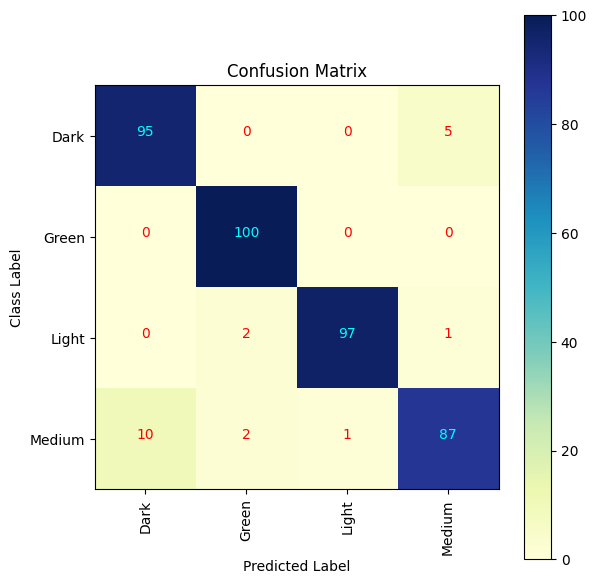

In [71]:
cm = confusion_matrix(test_gen_pics.classes, predicted_classes)
d1=test_gen_pics.class_indices
classes = list(d1.keys())
cmap= plt.cm.YlGnBu
plt.figure(figsize= (6, 6))
plt.imshow(cm, interpolation= 'nearest', cmap= cmap)
plt.title('Confusion Matrix')
plt.colorbar(shrink=True)
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 90)
plt.yticks(tick_marks, classes)
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'aqua' if cm[i, j] > thresh else 'red')
plt.tight_layout()
plt.ylabel('Class Label')
plt.xlabel('Predicted Label')
cm